In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#!tar -xvzf lpd_17_cleansed.tar.gz

In [ ]:
#!tar -xvzf labels.tar.gz

In [ ]:
!pip install -qU pyfluidsynth pretty_midi

In [ ]:
!sudo apt-get install -y libfluidsynth

In [ ]:
!apt-get update -qq && apt-get install -qq libfluidsynth1 fluid-soundfont-gm build-essential libasound2-dev libjack-dev
!pip install -qU pyfluidsynth pretty_midi
!pip install music21
!pip install pypianoroll
!pip install mir_eval

In [ ]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pretty_midi
import librosa
import mir_eval
import mir_eval.display
import tables
import IPython.display
import os
import json
import random
import pandas as pd
import pypianoroll
import torch
import torch.nn as nn
from torch.nn import functional as F
from datetime import datetime

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Local path constants
DATA_PATH = 'data'
RESULTS_PATH = 'results'

# Utility functions for retrieving paths
def msd_id_to_dirs(msd_id):
    """Given an MSD ID, generate the path prefix.
    E.g. TRABCD12345678 -> A/B/C/TRABCD12345678"""
    return os.path.join(msd_id[2], msd_id[3], msd_id[4], msd_id)

def msd_id_to_mp3(msd_id):
    """Given an MSD ID, return the path to the corresponding mp3"""
    return os.path.join(DATA_PATH, 'msd', 'mp3',
                        msd_id_to_dirs(msd_id) + '.mp3')

def msd_id_to_h5(h5):
    """Given an MSD ID, return the path to the corresponding h5"""
    return os.path.join(RESULTS_PATH, 'lmd_matched_h5',
                        msd_id_to_dirs(msd_id) + '.h5')

def get_midi_npz_path(msd_id, midi_md5):
    return os.path.join(data_dir,
                        msd_id_to_dirs(msd_id), midi_md5 + '.npz')

def get_midi_path(msd_id, midi_md5, kind):
    """Given an MSD ID and MIDI MD5, return path to a MIDI file.
    kind should be one of 'matched' or 'aligned'. """
    return os.path.join(RESULTS_PATH, 'lmd_{}'.format(kind),
                        msd_id_to_dirs(msd_id), midi_md5 + '.mid')

In [ ]:
root_dir = '/content/drive/MyDrive/Project FOLDER NAME'
data_dir = root_dir + '/Lakh Piano Dataset/lpd_17/lpd_17_cleansed'

In [ ]:
# Open the cleansed ids - cleansed file ids : msd ids
cleansed_ids = pd.read_csv(os.path.join(root_dir, 'Lakh Piano Dataset', 'cleansed_ids.txt'), delimiter = '    ', header = None)
lpd_to_msd_ids = {a:b for a, b in zip(cleansed_ids[0], cleansed_ids[1])}
msd_to_lpd_ids = {a:b for a, b in zip(cleansed_ids[1], cleansed_ids[0])}

<ipython-input-11-a153e6f0ebd3>:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  cleansed_ids = pd.read_csv(os.path.join(root_dir, 'Lakh Piano Dataset', 'cleansed_ids.txt'), delimiter = '    ', header = None)


In [ ]:
rock_song_ids = []

# Open the file in read mode
with open('/content/drive/MyDrive/Project/Lakh Piano Dataset/labels/tagtraum/id_list_Rock.txt', 'r') as file:
    # Read lines and remove leading/trailing whitespace
    rock_song_ids.extend([line.strip() for line in file.readlines()])

# Open the file in read mode
with open('/content/drive/MyDrive/Project/Lakh Piano Dataset/labels/lastfm/id_list_rock.txt', 'r') as file:
    # Read lines and remove leading/trailing whitespace
    rock_song_ids.extend([line.strip() for line in file.readlines()])

# Open the file in read mode
with open('/content/drive/MyDrive/Project/Lakh Piano Dataset/labels/amg/id_list_Pop_Rock.txt', 'r') as file:
    # Read lines and remove leading/trailing whitespace
    rock_song_ids.extend([line.strip() for line in file.readlines()])


# Randomly choose 1000 songs out of these
train_ids = random.choices(rock_song_ids, k = 250)

In [ ]:
# StandardTrack(name='Drums', program=0, is_drum=True, pianoroll=array(shape=(1249, 128), dtype=uint8))
# StandardTrack(name='Piano', program=0, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# StandardTrack(name='Chromatic Percussion', program=8, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# BinaryTrack(name='Organ', program=16, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# StandardTrack(name='Guitar', program=24, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# StandardTrack(name='Bass', program=32, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# BinaryTrack(name='Strings', program=40, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# StandardTrack(name='Ensemble', program=48, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# BinaryTrack(name='Brass', program=56, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Reed', program=64, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# StandardTrack(name='Pipe', program=72, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))
# BinaryTrack(name='Synth Lead', program=80, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Synth Pad', program=88, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Synth Effects', program=96, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Ethnic', program=104, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# BinaryTrack(name='Percussive', program=112, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=bool))
# StandardTrack(name='Sound Effects', program=120, is_drum=False, pianoroll=array(shape=(1249, 128), dtype=uint8))

In [ ]:
combined_pianorolls_path = 'rock_250_combined_pianorolls.pt'
# Check if the tensor file already exists
if os.path.exists(combined_pianorolls_path):
   # If the file exists, load the tensor
   combined_pianorolls = torch.load(combined_pianorolls_path)
else:
 combined_pianorolls = []
 for msd_file_name in train_ids:

   lpd_file_name = msd_to_lpd_ids[msd_file_name]
   # Get the NPZ path
   npz_path = get_midi_npz_path(msd_file_name, lpd_file_name)
   multitrack = pypianoroll.load(npz_path)
   multitrack.set_resolution(4).pad_to_same()

   # Initialize parts for all tracks
   parts = {track_name: None for track_name in [
       'Drums', 'Piano', 'Chromatic Percussion', 'Organ', 'Guitar', 'Bass',
       'Strings', 'Ensemble', 'Brass', 'Reed', 'Pipe', 'Synth Lead', 'Synth Pad',
       'Synth Effects', 'Ethnic', 'Percussive', 'Sound Effects'
   ]}

   # Initialize an empty array to use for missing parts
   empty_array = None

   # Process each track in the multitrack
   for track in multitrack.tracks:
       if track.pianoroll.shape[0] > 0 and empty_array is None:
           empty_array = np.zeros_like(track.pianoroll)
       parts[track.name] = track.pianoroll if track.pianoroll.shape[0] > 0 else empty_array.copy()

   # Stack all parts together
   combined_pianoroll = torch.stack([torch.tensor(parts[track_name], dtype=torch.uint8) for track_name in parts])

   # Append the combined pianoroll to the list
   combined_pianorolls.append(combined_pianoroll)

 # Save the combined pianorolls to a file
 torch.save(combined_pianorolls, combined_pianorolls_path)

In [ ]:
torch.save(combined_pianorolls, 'combined_pianorolls.pt')

In [ ]:
# Convert predictions into the multitrack pianoroll
pianoroll_numpy = combined_pianorolls[0]

piano_track = pypianoroll.StandardTrack(name = 'Piano', program = 0, is_drum = False, pianoroll = pianoroll_numpy[0, :, :].detach().cpu().numpy())
guitar_track = pypianoroll.StandardTrack(name = 'Guitar', program = 24, is_drum = False, pianoroll = pianoroll_numpy[1, :, :].detach().cpu().numpy())
bass_track = pypianoroll.StandardTrack(name = 'Bass', program = 32, is_drum = False, pianoroll = pianoroll_numpy[2, :, :].detach().cpu().numpy())
strings_track = pypianoroll.StandardTrack(name = 'Strings', program = 48, is_drum = False, pianoroll = pianoroll_numpy[3, :, :].detach().cpu().numpy())
drums_track = pypianoroll.StandardTrack(name = 'Drums', is_drum = True, pianoroll = pianoroll_numpy[4, :, :].detach().cpu().numpy())

generated_multitrack = pypianoroll.Multitrack(name = 'Generated', resolution = 4, tracks = [piano_track, guitar_track, bass_track, strings_track])

In [ ]:
!sudo apt-get install fluidsynth

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fluidsynth is already the newest version (2.2.5-1).
0 upgraded, 0 newly installed, 0 to remove and 28 not upgraded.


In [ ]:
# !pip install pyfluidsynth
import fluidsynth
generated_pm = pypianoroll.to_pretty_midi(generated_multitrack)
generated_midi_audio = generated_pm.fluidsynth()
IPython.display.Audio(generated_midi_audio, rate = 44100)

In [ ]:
pianorolls_list = combined_pianorolls

In [ ]:
print(combined_pianorolls[4].shape)

torch.Size([5, 1952, 128])


In [ ]:
mini_data = combined_pianorolls
print(mini_data[0].size())
print(len(mini_data))
mini_data_concat = torch.hstack(mini_data)
print(mini_data_concat.shape)
mini_data_concat = mini_data_concat[:, :, 24:96]
print(mini_data_concat.shape)
mini_data_concat_binary = mini_data_concat.clone()
print(mini_data_concat_binary.shape)
mini_data_concat_binary[mini_data_concat_binary > 0.2] = 1.0
print(mini_data_concat_binary.shape)
mini_data_concat_binary = mini_data_concat_binary.type(torch.float32)
print(mini_data_concat_binary.shape)

torch.Size([17, 1539, 128])
250
torch.Size([17, 432786, 128])
torch.Size([17, 432786, 72])
torch.Size([17, 432786, 72])
torch.Size([17, 432786, 72])
torch.Size([17, 432786, 72])


In [ ]:
a = mini_data_concat_binary[:, 1000:1200, :].contiguous()
a = a.view(1, -1, 72).squeeze(0).detach().cpu().numpy()

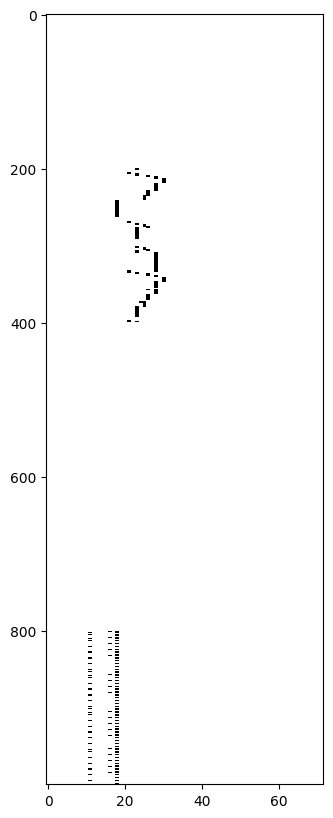

In [ ]:
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(111)
ax.imshow(a, cmap = 'gray_r', interpolation = 'nearest')
ax.set_aspect(0.2)
plt.show()

In [ ]:
from torch.utils.data import Dataset, DataLoader

In [ ]:
# Deterministic dataset that does not change over epochs
class GANMusicDatasetDeterministic(Dataset):
  def __init__(self, data, seq_length = 64):

    # Normalize
    #data = data / 127

    self.data = data
    self.seq_length = seq_length

  def __getitem__(self, index):
    x = self.data[:, (index * self.seq_length):(index+1) * self.seq_length, :]
    return x

  def __len__(self):
    return int(self.data.size(1) / self.seq_length)

In [ ]:
index=4
seq_length = 64
print(mini_data_concat_binary[:, (index * seq_length):(index+1) * seq_length, :].shape)

torch.Size([5, 64, 72])


In [ ]:
# Get the 10000 random sequences
class GANMusicDataset(Dataset):
  def __init__(self, list_of_sequences, dataset_length = 32 * 10000, seq_length = 64):

    # Normalize
    list_of_sequences = [e / 127.0 for e in list_of_sequences]

    self.data = list_of_sequences
    self.n_songs = len(list_of_sequences)
    self.seq_length = seq_length
    self.length = dataset_length

  def __getitem__(self, index):

    # Choose a random song id
    song_id = random.randint(0, self.n_songs - 1)
    song_length = self.data[song_id].size()[1]

    # Choose a random start window - the prev_x_sequence and x_sequence are consecutive, non-overlapping chunks of length 64
    start_time = random.randint(0, song_length - self.seq_length * 2 - 1)
    #prev_x_sequence = self.data[song_id][:, start_time:(start_time + self.seq_length), :]
    x_sequence = self.data[song_id][:, (start_time + self.seq_length):(start_time + self.seq_length * 2), :]

    # Give a random chord (0 for now)
    #chord = torch.zeros(13, dtype = torch.float32)

    #print(start_time, start_time + self.seq_length, start_time + self.seq_length * 2)

    return x_sequence

  def __len__(self):
    return self.length

In [ ]:
# TESTING CODE
dataset = GANMusicDataset(pianorolls_list, seq_length = 16)
loader = DataLoader(dataset, batch_size = 64,
                                     drop_last=True)

x_sequence = next(iter(loader))

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

import time
import random
import pathlib

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import make_grid
from IPython.display import HTML, display

def progress(batch, loss, batches):
    return HTML("""
        Training loss: {loss}

            {batch}

    """.format(loss=loss, batch=batch, batches=batches))

In [ ]:
def sigmoid_cross_entropy_with_logits(inputs,labels):
    loss = nn.BCEWithLogitsLoss()
    output = loss(inputs, labels)
    return output

In [ ]:
def train_full_GAN(gen, disc,
                    loader, z_dim,
                    epochs=5, disp_batch_size = 24, start_epoch = 0):
    gen.to(device).train()
    disc.to(device).train()

    disc_opt = torch.optim.Adam(disc.parameters(), lr= 0.0006, betas=(0.0, 0.99))
    gen_opt = torch.optim.Adam(gen.parameters(), lr = 0.0003, betas=(0.0, 0.99))

    fixed_noise = torch.randn(17, z_dim).to(device)

    max_steps = epochs*len(loader)
    progress_bar = display(progress(0, 0, max_steps), display_id=True)
    gen_losses = []
    disc_losses = []
    steps = 0
    for epoch in range(epochs):
        for i, real in enumerate(loader):
          real = real.to(device)
          batch_size = len(real)

          # random standard normal noise for generator
          noise = torch.randn(batch_size, z_dim).to(device)

          ### Train Discriminator ###
          # Generator generates a fake image
          fake = gen(noise)

          # Pass the fake and real image to the discriminator
          # Next don't forget to give a detached fake to the discriminator
          # since we do not want to backdrop to generator yet
          disc_fake_pred, disc_fake_pred_sigmoid, fm_fake = disc(fake.detach())
          disc_real_pred, disc_real_pred_sigmoid, fm_real = disc(real)

          # Calculate discriminator loss
          noise = torch.rand_like(disc_real_pred) / 10
          disc_loss_real = sigmoid_cross_entropy_with_logits(disc_real_pred, torch.ones_like(disc_real_pred)).mean()
          noise = torch.rand_like(disc_real_pred) / 10
          disc_loss_fake = sigmoid_cross_entropy_with_logits(disc_fake_pred, torch.zeros_like(disc_fake_pred)).mean()
          disc_loss = (disc_loss_real + disc_loss_fake) / 2

          disc_opt.zero_grad()
          disc_loss.backward()
          disc_opt.step()

          ### Train Generator ###
         # for i in range(2): # Potentially train generator multiple times per discriminator train time
          # Get the discriminator's probability for the fake images
          disc_fake_pred, disc_fake_pred_sigmoid, fm_fake = disc(fake)

          # Calculate discriminator loss
          gen_loss = sigmoid_cross_entropy_with_logits(disc_fake_pred, torch.ones_like(disc_fake_pred)).mean()

          # Feature matching
          mse_loss = nn.MSELoss(reduction='mean')
          fm_g_loss1 = torch.mul(mse_loss(fake.mean(), real.mean()), 1)
          fm_g_loss2 = torch.mul(mse_loss(fm_fake.mean(), fm_real.mean()), 1)
          #print('gen loss: {}, fm_g_loss1: {}, fm_g_loss2: {}'.format(gen_loss, fm_g_loss1, fm_g_loss2))
          total_gen_loss = gen_loss + fm_g_loss1 + fm_g_loss2

          gen_opt.zero_grad()
          gen_loss.backward()
          gen_opt.step()

          gen_losses.append(gen_loss.item())
          disc_losses.append(disc_loss.item())

          progress_bar.update(progress(steps, (gen_losses[-1], disc_losses[-1]), max_steps))
          steps += 1

        ### Visualize the fake images
        if (epoch + 1) % 100 == 0:
          fig = plt.figure(figsize = (10, 10))
          ax = fig.add_subplot(111)
          fake = gen(fixed_noise)
          fake = fake.permute(0, 2, 1, 3).flatten(2, 3).flatten(0, 1).transpose(0,1)
          #fake = fake.view(1, -1, 360).squeeze(0).transpose(0, 1)
          fake = fake.detach().cpu().numpy()
          ax.imshow(fake, cmap='gray_r', vmin=0, vmax=1, interpolation = 'nearest')
          plt.title('Epoch {} Fake'.format(epoch))
          plt.show()

          fig = plt.figure(figsize = (10, 10))
          ax = fig.add_subplot(111)
          fake[fake < 0.7] = 0.0
          ax.imshow(fake, cmap='gray_r', vmin=0, vmax=1, interpolation = 'nearest')
          plt.title('Epoch {} Fake <0.8 set to 0'.format(epoch))
          plt.show()

          fig = plt.figure(figsize = (6, 6))
          ax = fig.add_subplot(111)
          real = real[0:5, :, :, :] # Subset only the first 20 samples, only piano part
          real = real.permute(0, 2, 1, 3).flatten(2, 3).flatten(0, 1).transpose(0,1)
          real = real.detach().cpu().numpy()
          ax.imshow(real, cmap='gray_r', vmin=0, vmax=1, interpolation='nearest')
          #ax.set_aspect(5)
          plt.title('Epoch {} Real'.format(epoch))
          plt.show()

          print('Epoch {} at {}'.format(epoch, datetime.now()))

        # Save checkpoints
        if (epoch + 1) % 500 == 0:
          save_path = os.path.join(root_dir, 'GAN Checkpoints', 'gan_25apr_11_checkpoint_gen_{}'.format(epoch + start_epoch))
          torch.save(gen.state_dict(), save_path)
          save_path = os.path.join(root_dir, 'GAN Checkpoints', 'gan_25apr_11_checkpoint_disc_{}'.format(epoch + start_epoch))
          torch.save(disc.state_dict(), save_path)

          with open(os.path.join(root_dir, 'GAN Checkpoints', 'gan_25apr_11_gen_loss'), 'w') as outfile:
            json.dump(gen_losses, outfile)
          with open(os.path.join(root_dir, 'GAN Checkpoints', 'gan_25apr_11_disc_loss'), 'w') as outfile:
            json.dump(disc_losses, outfile)

    plt.plot(gen_losses, label='Generator loss')
    plt.plot(disc_losses, label='Discriminator loss')
    plt.xlabel('Batches')
    plt.ylabel('Training loss')
    plt.legend()
    plt.show()

In [ ]:
# Input size: [batch_size x 5 x 16 x 128]

# **CHANGED FROM 128 TO 72

class DiscConvNet(nn.Module):
  def __init__(self, input_length = 16):
    super(DiscConvNet, self).__init__()

    self.conv1 = nn.Conv2d(in_channels = 17, out_channels = 16, kernel_size = (2, 72), stride = (2,2))
    self.conv2 = nn.Conv2d(in_channels = 16, out_channels = 16, kernel_size = (2, 1), stride = (2,2))
    self.conv3 = nn.Conv2d(in_channels = 16, out_channels = 16, kernel_size = (2, 1), stride = (2,2))
    self.conv4 = nn.Conv2d(in_channels = 16, out_channels = 16, kernel_size = (2, 1), stride = (2,2))
    self.conv5 = nn.Conv2d(in_channels = 16, out_channels = 16, kernel_size = (2, 1), stride = (2,2))
    #self.fc1 = nn.Linear(64 * 2, 128)
    #self.fc2 = nn.Linear(128, 128)
    self.out = nn.Linear(16 * 2, 1)
    self.prelu = nn.PReLU()
    self.sigmoid = nn.Sigmoid()
    self.batch_norm_2d = nn.BatchNorm2d(16)
    self.batch_norm_1d = nn.BatchNorm1d(128)
    self.dropout = nn.Dropout(0.5)

  def forward(self, input): # Input size: [batch_size x 5 x 16 x 128]
    x = self.prelu(self.batch_norm_2d(self.conv1(input))) # [batch_size x 64 x 8 x 1]
    fm = x.clone()
    x = self.dropout(x)
    x = self.prelu(self.batch_norm_2d(self.conv2(x))) # [batch_size x 64 x 4 x 1]
    x = self.dropout(x)
    x = self.prelu(self.batch_norm_2d(self.conv3(x))) # [batch_size x 64 x 2 x 1]
    x = self.dropout(x)
    x = self.prelu(self.batch_norm_2d(self.conv4(x))) # [batch_size x 64 x 2 x 1]
    x = self.dropout(x)
    x = self.prelu(self.batch_norm_2d(self.conv5(x))) # [batch_size x 64 x 2 x 1]
    x = x.flatten(1, -1) # [batch_size x 128]
    #x = self.prelu(self.batch_norm_1d(self.fc1(x))) # [batch_size x 128]
    #x = self.prelu(self.batch_norm_1d(self.fc2(x))) # [batch_size x 128]
    x = self.out(x)
    x_sigmoid = self.sigmoid(x) # [batch_size x 1]
    return x, x_sigmoid, fm

class DiscMLP(nn.Module):
  def __init__(self, input_length = 16):
    super(DiscMLP, self).__init__()

    self.fc1 = nn.Linear(5 * 16 * 72, 256)
    self.fc2 = nn.Linear(256, 128)
    self.fc3 = nn.Linear(128, 128)
    self.out = nn.Linear(128, 1)
    self.prelu = nn.PReLU()
    self.sigmoid = nn.Sigmoid()
    self.dropout = nn.Dropout(0.5)
    self.bn256 = nn.BatchNorm1d(256)
    self.bn128 = nn.BatchNorm1d(128)

  def forward(self, input):

    x = input.view(-1, 5 * 16 * 72)
    x = self.prelu(self.bn256(self.fc1(x)))
    x = self.dropout(x)
    x = self.prelu(self.bn128(self.fc2(x)))
    x = self.dropout(x)
    x = self.prelu(self.bn128(self.fc3(x)))
    x = self.out(x)
    x_sigmoid = self.sigmoid(x)
    fm = torch.zeros_like(input)

    return x, x_sigmoid, fm

class GenConvNet(nn.Module):
  def __init__(self, z_dim = 100, input_length = 16):
    super(GenConvNet, self).__init__()
    self.z_dim = z_dim

    #self.fc1 = nn.Linear(z_dim, 128)
    #self.fc2 = nn.Linear(128, 128)
    self.transpose_conv1 = nn.ConvTranspose2d(in_channels = z_dim, out_channels = 64, kernel_size = (2, 1), stride = (2,2))
    self.transpose_conv2 = nn.ConvTranspose2d(in_channels = 64, out_channels = 64, kernel_size = (2, 1), stride = (2,2))
    self.transpose_conv3 = nn.ConvTranspose2d(in_channels = 64, out_channels = 64, kernel_size = (2, 1), stride = (2,2))
    self.transpose_conv4 = nn.ConvTranspose2d(in_channels = 64, out_channels = 64, kernel_size = (2, 1), stride = (2,2))
    self.transpose_conv5 = nn.ConvTranspose2d(in_channels = 64, out_channels = 64, kernel_size = (2, 1), stride = (2,2))
    self.transpose_conv6 = nn.ConvTranspose2d(in_channels = 64, out_channels = 17, kernel_size = (2, 72), stride = (2,2))
    self.prelu = nn.PReLU()
    self.sigmoid = nn.Sigmoid()
    self.batch_norm_2d = nn.BatchNorm2d(64)
    self.batch_norm_1d = nn.BatchNorm1d(128)

  def forward(self, input):
    #x = self.prelu(self.batch_norm_1d(self.fc1(input)))
    #x = self.prelu(self.batch_norm_1d(self.fc2(x)))
    x = input.view(-1, self.z_dim, 1, 1)
    x = self.prelu(self.batch_norm_2d(self.transpose_conv1(x)))
    x = self.prelu(self.batch_norm_2d(self.transpose_conv2(x)))
    x = self.prelu(self.batch_norm_2d(self.transpose_conv3(x)))
    x = self.prelu(self.batch_norm_2d(self.transpose_conv4(x)))
    x = self.prelu(self.batch_norm_2d(self.transpose_conv5(x)))
    x = self.sigmoid(self.transpose_conv6(x))
    return x

In [ ]:
mini_dataset = GANMusicDatasetDeterministic(mini_data_concat_binary, seq_length = 64)
print(len(mini_dataset))
mini_loader = DataLoader(mini_dataset, batch_size = 64,
                                     drop_last=True)

6762


In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 and classname.find('ConvNet') == -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

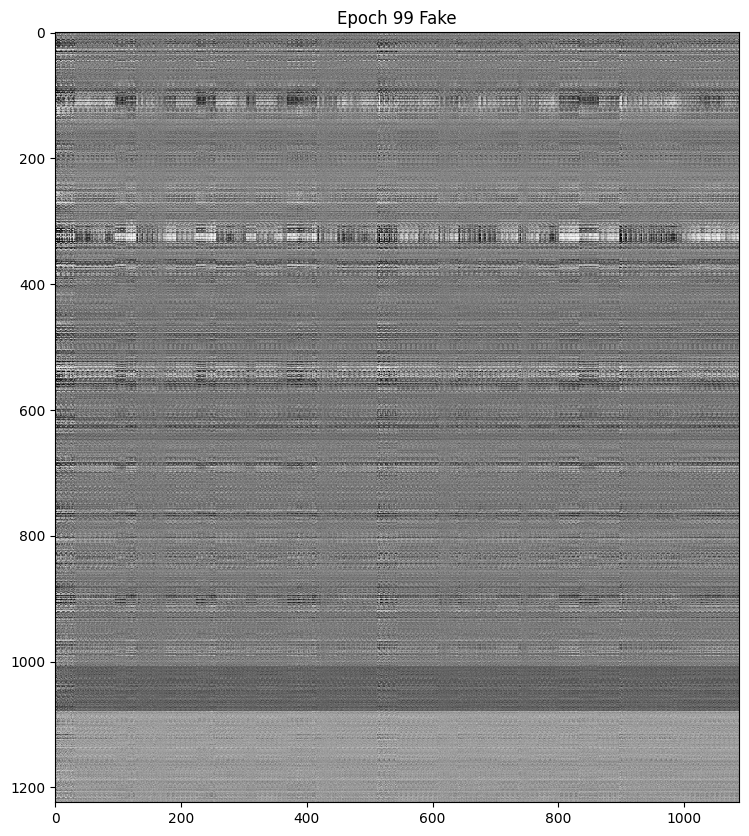

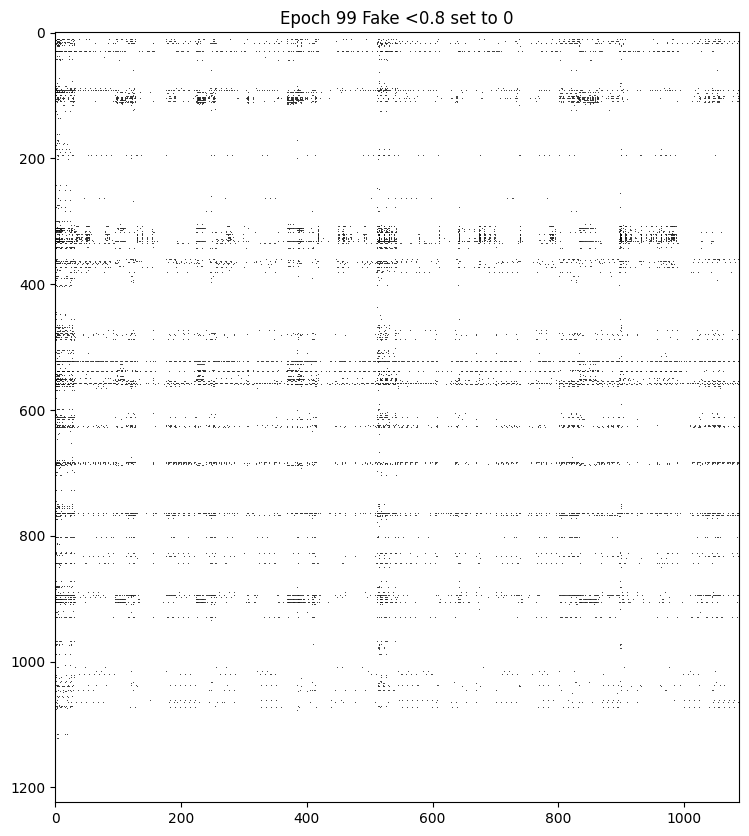

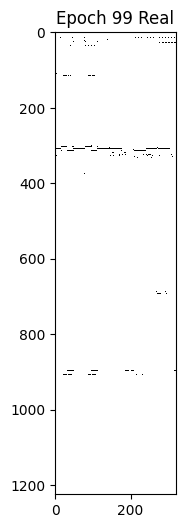

Epoch 99 at 2023-11-08 04:17:00.042435


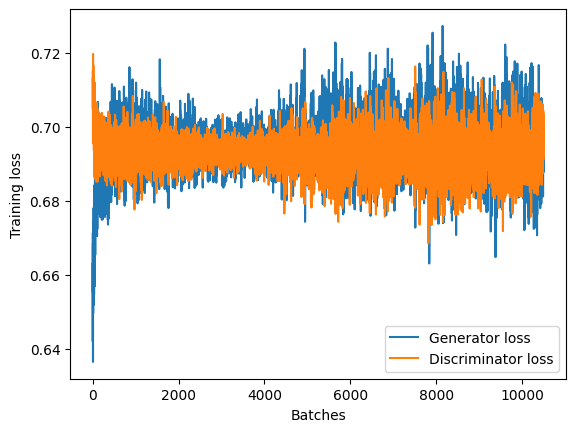

In [ ]:
z_dim = 100
disc = DiscConvNet()
gen = GenConvNet()
disc.apply(weights_init)
gen.apply(weights_init)
#gen.load_state_dict(torch.load(os.path.join(root_dir, 'GAN Checkpoints', 'gan_25apr_10_checkpoint_gen_999')))
#disc.load_state_dict(torch.load(os.path.join(root_dir, 'GAN Checkpoints', 'gan_25apr_10_checkpoint_disc_999')))
train_full_GAN(gen, disc, mini_loader, z_dim, epochs = 100, start_epoch = 0)

In [ ]:
# Generate some music samples
random_z = torch.randn((10,100)).to(device)
generated_sample = gen(random_z)
# Concatenate all the samples
#generated_sample = generated_sample.view(5, -1, 128)
generated_sample = generated_sample.permute(1, 0, 2, 3).flatten(1, 2)

# Bring back to 128 pitches
predictions = torch.zeros((17, 640, 128), dtype = torch.float32)
predictions[:, :, 24:96] = generated_sample
predictions[predictions < 0.7] = 0.0
predictions = predictions * 127

In [ ]:
# Define the program numbers and is_drum status for the tracks
track_info = {
   'Piano': {'program': 0, 'is_drum': False},
   'Chromatic Percussion': {'program': 8, 'is_drum': False},
   'Organ': {'program': 16, 'is_drum': False},
   'Guitar': {'program': 24, 'is_drum': False},
   'Bass': {'program': 32, 'is_drum': False},
   'Strings': {'program': 40, 'is_drum': False},
   'Ensemble': {'program': 48, 'is_drum': False},
   'Brass': {'program': 56, 'is_drum': False},
   'Reed': {'program': 64, 'is_drum': False},
   'Pipe': {'program': 72, 'is_drum': False},
   'Synth Lead': {'program': 80, 'is_drum': False},
   'Synth Pad': {'program': 88, 'is_drum': False},
   'Synth Effects': {'program': 96, 'is_drum': False},
   'Ethnic': {'program': 104, 'is_drum': False},
   'Percussive': {'program': 112, 'is_drum': False},
   'Sound Effects': {'program': 120, 'is_drum': False},
   'Drums': {'program': 0, 'is_drum': True}
}

# Create the tracks
tracks = []
for i, (track_name, info) in enumerate(track_info.items()):
   track = pypianoroll.StandardTrack(
       name=track_name,
       program=info['program'],
       is_drum=info['is_drum'],
       pianoroll=predictions[i].detach().cpu().numpy()
   )
   tracks.append(track)

# Create the multitrack object with the specified resolution and tempo
generated_multitrack = pypianoroll.Multitrack(
   name='Generated',
   resolution=24,
   tempo=np.full((predictions.shape[1],), 120.0),
   downbeat=np.zeros((predictions.shape[1],), dtype=bool),
   tracks=tracks
)

# Set the size of the plot
plt.figure(figsize=(500, 500))
# Plot the generated multitrack
generated_multitrack.plot()

In [ ]:
# Convert generated multitrack to pretty midi
generated_pm = pypianoroll.to_pretty_midi(generated_multitrack)
generated_midi_audio = generated_pm.fluidsynth()
IPython.display.Audio(generated_midi_audio, rate = 44100)